# Paint By Number Generator

In this notebook, we will demonstrate how to generate a lineart and color map based on the available paint colors.

In [1]:
import os
import cv2
import numpy as np
from PIL import Image, ImageDraw, ImageFont
from sklearn.cluster import KMeans, MiniBatchKMeans
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
%matplotlib inline

## Define RGB to Paint Map

In [33]:
paint_map = {
    "Titanium White": (254, 254, 254),
    "Lemon Yellow": (255, 247, 0),
    "Medium Yellow": (255, 209, 0),
    "Orange Yellow": (255, 159, 0),
    "Vermilion": (255, 92, 0),
    "Crimson": (239, 41, 41),
    "Rose": (223, 71, 89),
    "Carmine": (210, 30, 72),
    "Purple": (165, 0, 165),
    "Lavender": (142, 87, 224),
    "Violet": (70, 35, 105),
    "Ultramarine Blue": (0, 0, 255),
    "Sky Blue": (0, 153, 255),
    "Cyan Blue": (0, 225, 255),
    "Turquoise Blue": (0, 179, 170),
    "Pthalo Green": (0, 128, 0),
    "Green": (0, 160, 0),
    "Olive Green": (60, 128, 49),
    "Lime Green": (128, 255, 0),
    "Yellow Ochre": (204, 119, 34),
    "Raw Sienna": (201, 143, 71),
    "Burnt Sienna": (174, 78, 40),
    "Raw Umber": (130, 102, 68),
    "Burnt Umber": (83, 52, 30),
    #"Grey": (128, 128, 128),
    #"Payne's Grey": (83, 89, 97),
    #"Black": (0, 0, 0),
    "Gold": (212, 175, 55),
    #"Silver": (192, 192, 192),
    "Bronze": (140, 120, 83),
    "Pearl White": (234, 224, 200),
    "Champagne": (248, 215, 142),
    "Skin Pink": (255, 194, 170),
    "Blush Pink": (255, 126, 121),
}

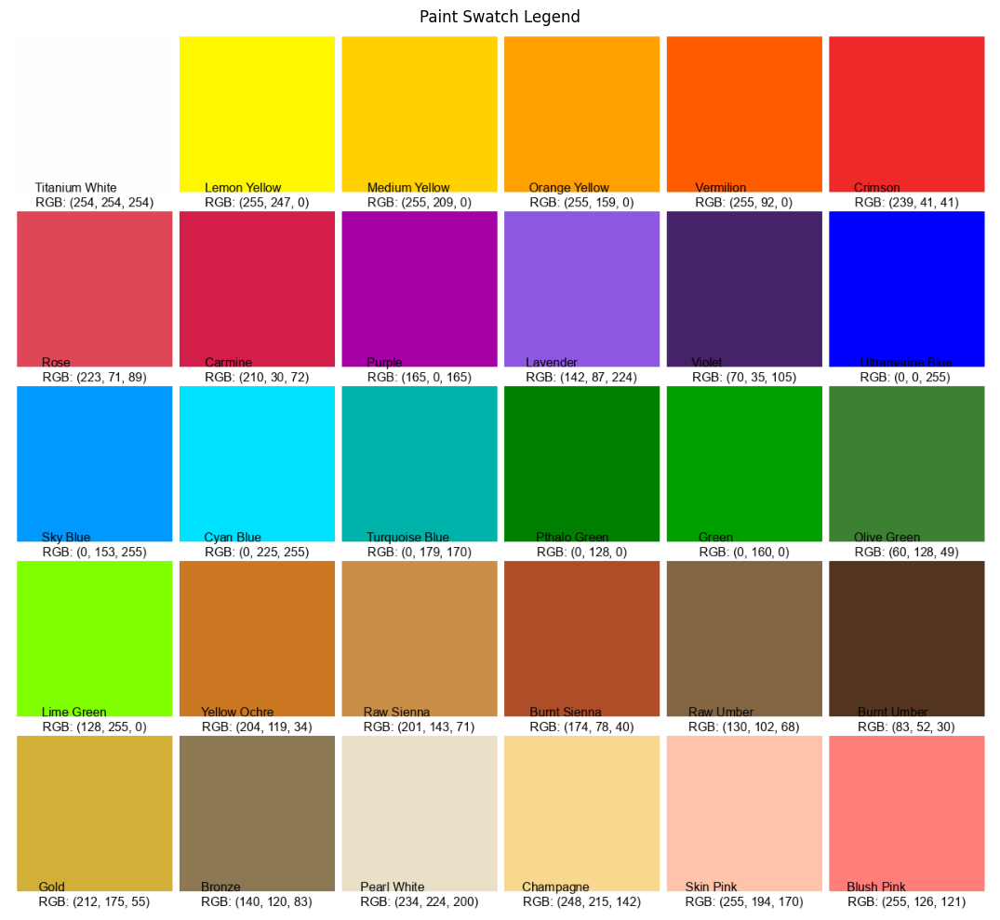

In [34]:
def create_paint_swatch(paint_map):
    swatch_size, padding, font_size = 200, 10, 16
    
    num_colors = len(paint_map)
    num_cols = 6
    num_rows = (num_colors + num_cols - 1) // num_cols
    
    swatch_width = num_cols * (swatch_size + padding) + padding
    swatch_height = num_rows * (swatch_size + padding + font_size) + padding
    
    swatch = Image.new('RGB', (swatch_width, swatch_height), (255, 255, 255))
    draw = ImageDraw.Draw(swatch)
    font = ImageFont.truetype("fonts/arial.ttf", font_size)
    
    for i, (color_name, color_rgb) in enumerate(paint_map.items()):
        row = i // num_cols
        col = i % num_cols
        x = col * (swatch_size + padding) + padding
        y = row * (swatch_size + padding + font_size) + padding
        
        draw.rectangle((x, y, x+swatch_size, y+swatch_size), fill=color_rgb)
        
        text_x = x + swatch_size/2
        text_y = y + swatch_size + padding/2
        text = f"{color_name}\nRGB: {color_rgb}"
        draw.text((text_x, text_y), text, font=font, fill=(0, 0, 0), anchor="mm")
    
    return swatch

swatch = create_paint_swatch(paint_map)
fig = plt.figure(figsize=(20, 10))
plt.imshow(swatch)
plt.title("Paint Swatch Legend")
plt.axis("off")
plt.tight_layout()

## RGB to Paint Mapping

In [82]:
def map_rgb_to_custom_paint(rgb, paint_map):
    rgb_array = np.array(rgb)
    distances = np.sqrt(np.sum((np.array(list(paint_map.values())) - rgb_array)**2, axis=1))
    closest_index = np.argmin(distances)
    paint_name = list(paint_map.keys())[closest_index]
    return paint_name, np.array(paint_map[paint_name])

def convert_image_to_paint(input_image, paint_map, sample):
    image = cv2.imread(input_image)
    h, w, _ = image.shape
    
    if sample:
        h = int(h * 0.25)
        w = int(w * 0.25)
        image = cv2.resize(image, (w, h), interpolation=cv2.INTER_AREA)

    new_image = np.zeros_like(image)
    used_paints = {}
    for i in range(h):
        for j in range(w):
            paint_name, paint_color = map_rgb_to_custom_paint(image[i, j], paint_map)
            new_image[i, j] = paint_color
            if paint_name:
                key = paint_name
                used_paints[key] = used_paints.get(key, 0) + 1

    return new_image, used_paints

def generate_linearts(new_image, paint_map):
    gray = cv2.cvtColor(new_image, cv2.COLOR_RGB2GRAY)
    edges = cv2.Canny(gray, 100, 200)
    lineart = cv2.bitwise_not(edges)
    font = cv2.FONT_HERSHEY_SIMPLEX
    font_scale = 0.3
    font_thickness = 1
    lineart_numbers = np.full_like(new_image, 255)

    for x in range(0, new_image.shape[0], 10):
        for y in range(0, new_image.shape[1], 10):
            color, _ = map_rgb_to_custom_paint(new_image[x, y], paint_map)
            color_label = list(paint_map.keys()).index(color)
            cv2.putText(lineart, str(color_label + 1), (y, x), font, font_scale, (128, 128, 128), font_thickness, cv2.LINE_AA)
            cv2.putText(lineart_numbers, str(color_label + 1), (y, x), font, font_scale, (128, 128, 128), font_thickness, cv2.LINE_AA)

    return lineart, lineart_numbers

def create_paint_legend(used_colors):
    swatch_size, padding, font_size = 200, 10, 16    
    num_colors = len(used_colors)
    num_cols = 6
    num_rows = (num_colors + num_cols - 1) // num_cols
    
    swatch_width = num_cols * (swatch_size + padding) + padding
    swatch_height = num_rows * (swatch_size + padding + font_size) + padding
    
    swatch = Image.new('RGB', (swatch_width, swatch_height), (255, 255, 255))
    draw = ImageDraw.Draw(swatch)
    font = ImageFont.truetype("fonts/arial.ttf", font_size)
    
    total_usage = sum(used_colors.values())
    
    for i, color_name in enumerate(used_colors):
        color_rgb = paint_map[color_name]
        color_usage = used_colors[color_name]
        usage_percentage = (color_usage / total_usage) * 100
        row = i // num_cols
        col = i % num_cols
        x = col * (swatch_size + padding) + padding
        y = row * (swatch_size + padding + font_size) + padding
        draw.rectangle((x, y, x+swatch_size, y+swatch_size), fill=color_rgb)
        text_x = x + swatch_size/2
        text_y = y + swatch_size/2
        text = f"{color_name}\nRGB: {color_rgb}\nUsage: {usage_percentage:.0f}%"
        draw.text((text_x, text_y), text, font=font, fill=(0, 0, 0), anchor="mm")
    return swatch

# Sample

In [90]:
input_image = 'images/input/me_with_sunflowers.jpg'

new_image, used_paints = convert_image_to_paint(input_image=input_image, paint_map=paint_map, sample=False)
lineart, lineart_numbers = generate_linearts(new_image, paint_map)
swatch = create_paint_legend(used_paints)

cv2.imwrite('images/output/me_with_sunflowers2_matched.png', new_image)
cv2.imwrite('images/output/me_with_sunflowers2_lineart.png', lineart)
cv2.imwrite('images/output/me_with_sunflowers2_lineart_numbers.png', lineart_numbers)
swatch.save('images/output/me_with_sunflowers2_lineart_swatch.png')

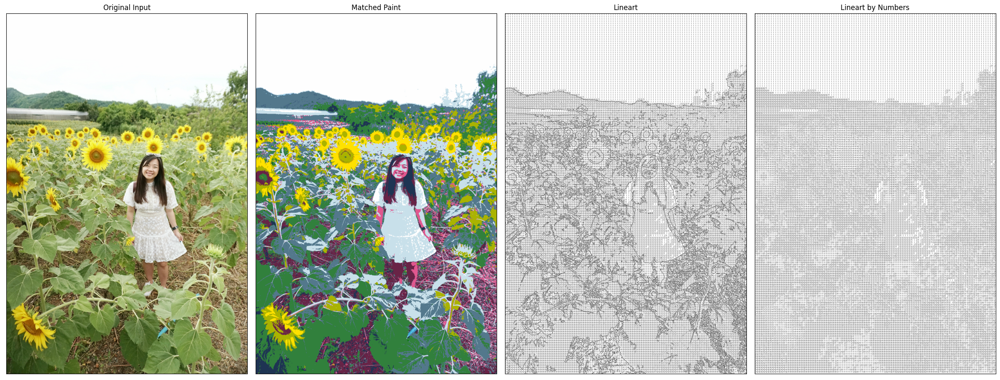

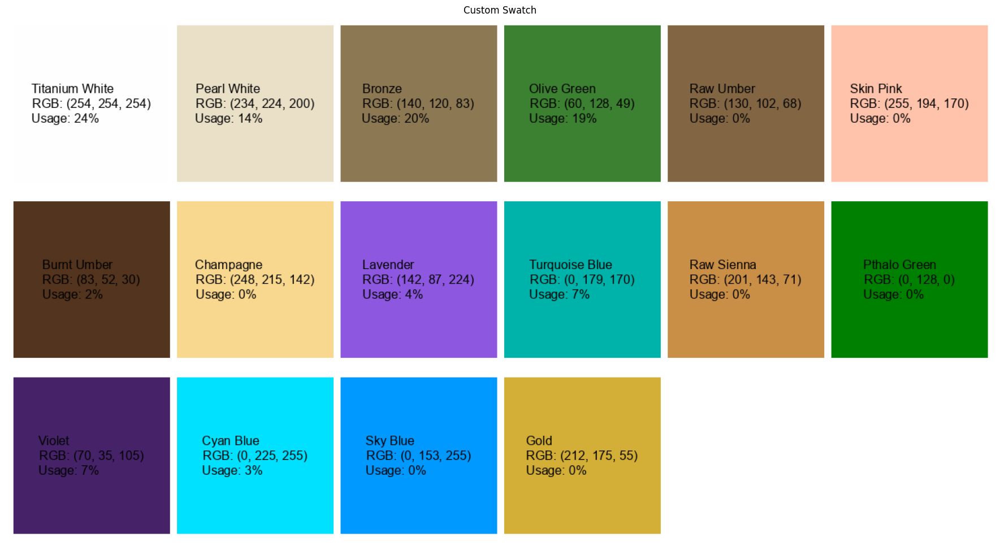

In [91]:
original = cv2.imread(input_image)
original = cv2.cvtColor(original, cv2.COLOR_BGR2RGB)
new_image = cv2.cvtColor(new_image, cv2.COLOR_BGR2RGB)

fig, axs = plt.subplots(1, 4, figsize=(24, 20))
axs[0].imshow(original)
axs[0].set_title('Original Input')
axs[1].imshow(new_image)
axs[1].set_title('Matched Paint')
axs[2].imshow(lineart, cmap='gray')
axs[2].set_title('Lineart')
axs[3].imshow(lineart_numbers, cmap='gray')
axs[3].set_title('Lineart by Numbers')
for ax in axs.flatten():
    ax.set_xticks([])
    ax.set_yticks([])

fig.tight_layout()
plt.show()

fig = plt.figure(figsize=(20, 10))
plt.imshow(swatch)
plt.title("Custom Swatch")
plt.axis("off")
plt.tight_layout()

In [86]:
input_image = 'images/input/me_with_sunflowers_detailed.jpg'

new_image, used_paints = convert_image_to_paint(input_image=input_image, paint_map=paint_map, sample=False)
lineart, lineart_numbers = generate_linearts(new_image, paint_map)
swatch = create_paint_legend(used_paints)

cv2.imwrite('images/output/me_with_sunflowers_matched.png', new_image)
cv2.imwrite('images/output/me_with_sunflowers_lineart.png', lineart)
cv2.imwrite('images/output/me_with_sunflowers_lineart_numbers.png', lineart_numbers)
swatch.save('images/output/me_with_sunflowers_lineart_swatch.png')

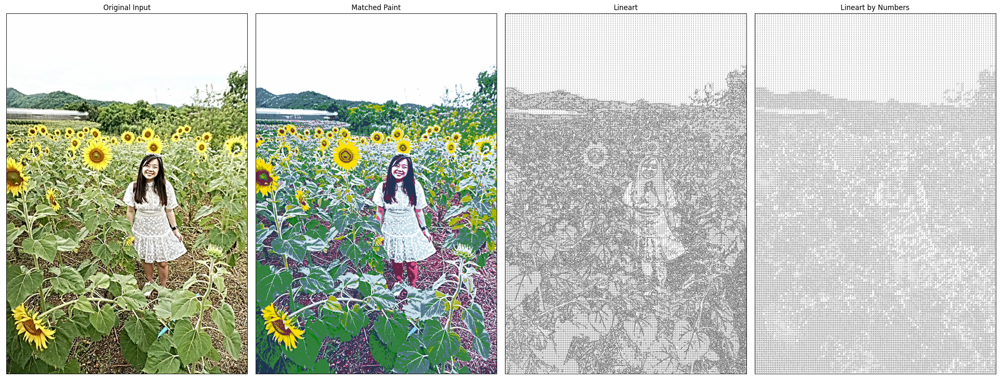

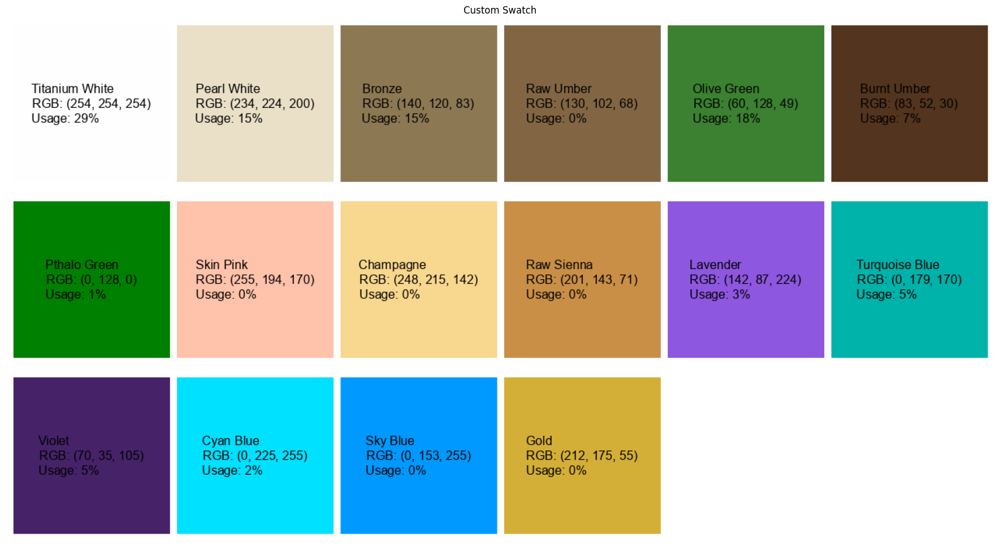

In [87]:
original = cv2.imread(input_image)
original = cv2.cvtColor(original, cv2.COLOR_BGR2RGB)
new_image = cv2.cvtColor(new_image, cv2.COLOR_BGR2RGB)

fig, axs = plt.subplots(1, 4, figsize=(24, 20))
axs[0].imshow(original)
axs[0].set_title('Original Input')
axs[1].imshow(new_image)
axs[1].set_title('Matched Paint')
axs[2].imshow(lineart, cmap='gray')
axs[2].set_title('Lineart')
axs[3].imshow(lineart_numbers, cmap='gray')
axs[3].set_title('Lineart by Numbers')
for ax in axs.flatten():
    ax.set_xticks([])
    ax.set_yticks([])

fig.tight_layout()
plt.show()

fig = plt.figure(figsize=(20, 10))
plt.imshow(swatch)
plt.title("Custom Swatch")
plt.axis("off")
plt.tight_layout()

In [88]:
input_image = 'images/input/shihtzu.jpeg'

new_image, used_paints = convert_image_to_paint(input_image=input_image, paint_map=paint_map, sample=False)
lineart, lineart_numbers = generate_linearts(new_image, paint_map)
swatch = create_paint_legend(used_paints)

cv2.imwrite('images/output/shihtzu_matched.png', new_image)
cv2.imwrite('images/output/shihtzu_lineart.png', lineart)
cv2.imwrite('images/output/shihtzu_lineart_numbers.png', lineart_numbers)
swatch.save('images/output/shihtzu_lineart_swatch.png')

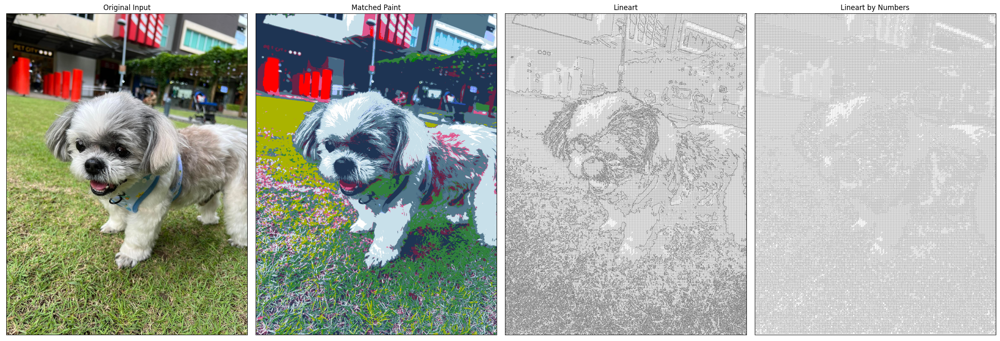

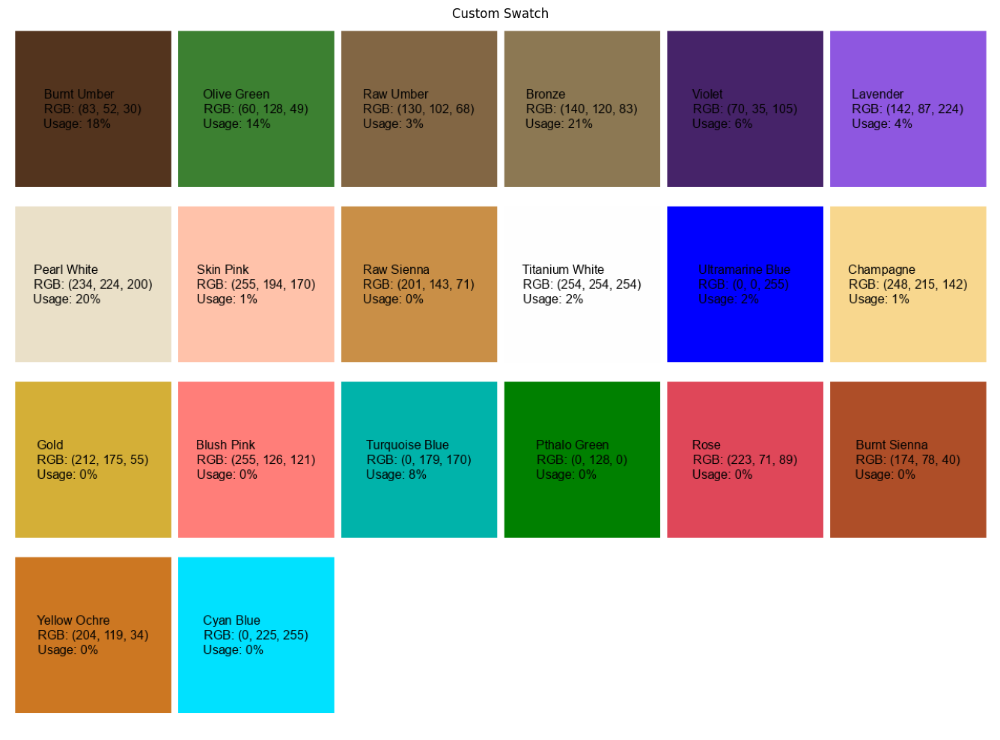

In [89]:
original = cv2.imread(input_image)
original = cv2.cvtColor(original, cv2.COLOR_BGR2RGB)
new_image = cv2.cvtColor(new_image, cv2.COLOR_BGR2RGB)

fig, axs = plt.subplots(1, 4, figsize=(24, 20))
axs[0].imshow(original)
axs[0].set_title('Original Input')
axs[1].imshow(new_image)
axs[1].set_title('Matched Paint')
axs[2].imshow(lineart, cmap='gray')
axs[2].set_title('Lineart')
axs[3].imshow(lineart_numbers, cmap='gray')
axs[3].set_title('Lineart by Numbers')
for ax in axs.flatten():
    ax.set_xticks([])
    ax.set_yticks([])

fig.tight_layout()
plt.show()

fig = plt.figure(figsize=(20, 10))
plt.imshow(swatch)
plt.title("Custom Swatch")
plt.axis("off")
plt.tight_layout()